# Human Pose Estimation: YoloV8
## Classifying Running Biomechanics

In this notebook I aim to explore using YOLOv8 pose data to estimate running biomechanics. Specifically, I am going to limit the scope of the task to classifying what is called the "initial contact".

The moment the gait cycle begins is when one foot comes in contact with the ground. The cycle lasts until the same foot again comes in contact with the ground. These moments of impact are referred to as intial contact.

### Goal
The goal then is to use yolov8 pose estimation data to build and train a classifier that will detect the point of initial contact.

### Method
1. Extract pose data for runners using YOLOv8
2. Using a single runner, clean data and identify initial contact
3. Train a classifier on the data

In [2]:
from itertools import cycle
import numpy as np
import pandas as pd
from numpy.linalg import lstsq

from ultralytics import YOLO
from ultralytics.yolo.utils.plotting import *
import cv2
from PIL import Image
from IPython.display import Video

import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

<video width="460"  controls>
  <source src="../cv_assets/pose03.mp4" type="video/mp4">
</video>

# Pose Detection with YOLOv8

In [3]:
# use pretrained model
VERSION = 'yolov8s-pose.pt'

# load pretrained model
yolo = YOLO('models/'+VERSION)

In [4]:
save_path = '/Users/devindearaujo/Desktop/deep_learning/04_vision/'

results = yolo.predict(source_video, 
                    save=True, 
                    name=save_path,
                    stream=True,
                    boxes=False, 
                    verbose=False, # do not output to terminal
                   )

In [5]:
# loop through results
# get keypoint data
stream_data = []

for i,frame in enumerate(results):
    orig_img = frame.orig_img
    kpts = frame.keypoints.data # Keypoints

    data = {'frame':i, 'orig_img':orig_img, 'kpts':kpts}
    stream_data.append(data)

Results saved to /Users/devindearaujo/Desktop/deep_learning/04_vision3


<video width="460"  controls>
  <source src="../cv_assets/pose03.mov" type="video/mp4">
</video>

In [13]:
print(f'there are {len(stream_data)} frames in video')

there are 447 frames in video


## Identifying Initial Contact

I could go through the video frame by frame and flag the frames where a runner's foot has touched thr ground, but this seems tedious and if the dataset was any bigger it would quickly become infeasible to do this by hand.

Instead, I'm going to build some tooling to assist with this. The idea is simple, using a single runner (maybe the chap on the right hand side: RHS), draw a line across the frame where the treadmill serface is located. Then find or estimate the point where the feet coordinates intersect or collide with this line. 

The distance between the line and the point of intersection can be measured by calculating the error between the two. Where the error is small, the foot is likely close to the line, we can assume the minima is the point of contact.

To do this, we will need to get the coordinates of each runner and store them separately. 

# Sidebar: the point of intersection between a point and a line

If I can identify where foot hits the ground, then I can then calssify the onset or initial contact. Once I have this I could probably identify other statistics like the stride or gait! But for now, the initial contact will do.

Below is a simple example, building the mechanics that we will use in our real problem.

Basically, I have a line, given by two sets of coordinates (x,y pairs) and I have a point that approaches that line. I need to find the point on the line where the distance between the line and points is the smallest (ie lowest error).

There are plenty of libraries that can help solve this as well as more rigorous mathematics but the below is good enough for a rough POC.

In [14]:
def solve_line(x,y):
    """ 
    solve line equation by least squares
    ref: https://numpy.org/doc/stable/reference/generated/numpy.linalg.lstsq.html

    arguments:
        x,y: two sets of coordinates (x,y pairs)
    """
    A = np.vstack([x, np.ones(len(x))]).T

    m, c = np.linalg.lstsq(A, y, rcond=None)[0]
    return m,c

In [15]:
# fitting a line through 
# two sets of coordinates

x = np.array([3.9210, 9.3849])
y = np.array([4.1213, 5.2848])

m,c, = solve_line(x,y)

print("Line Solution is y = {m}x + {c}".format(m=m,c=c))

Line Solution is y = 0.2129431358553416x + 3.2863499643112064


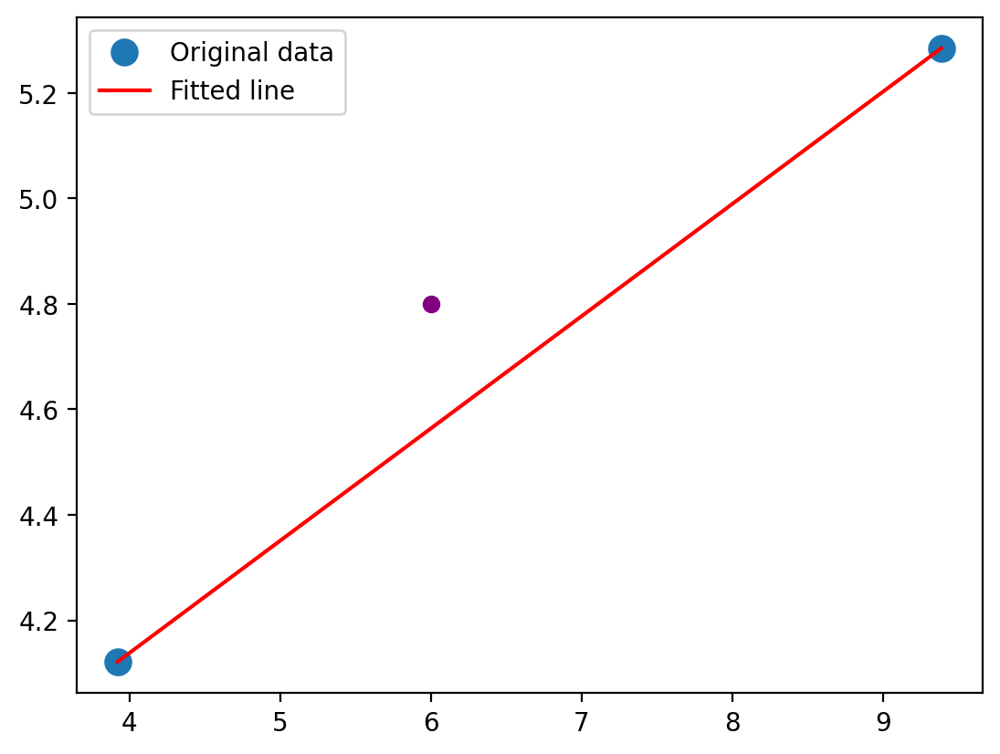

In [16]:
# plot line with random point to illustrate problem

# random point
point = np.array([6.0, 4.8])

plt.plot(x, y, 'o', label='Original data', markersize=10)
plt.plot(x, m*x + c, 'r', label='Fitted line')
plt.scatter(*point, c='purple')
plt.legend()

plt.show();

The plot above describes the problem visually, we have a line, and a point heading towards it. Where will that point intersect with the line? We need a function that will estimate this given the points current position and a function that will measure the error which will help us select the closest point in our frames.

In [17]:
def RMSE(x,y):
    """ root mean squared error"""
    return np.sqrt(np.sum((x-y)**2))

def calc_intersection_point(m, c, point_coords:np.array):
    """
    calculates the expected point of contact
    between a line given by y=mx+c and a point
    given as a set of coordinates
    
    arguments:
        point_coords: x and y coords for point
        m: slope of line
        c: intercept of line
    """
    point_x, point_y = point_coords
    
    # x-coordinate of the intersection point
    intersection_x = (point_y - c) / m
    
    # y-coordinate of the intersection point
    intersection_y = m * intersection_x + c
    
    return intersection_x, intersection_y

**mock example**

I've mocked up some data that describes the point (ie y coordinates are decreasing) as it moves closer and closer to the line. We want to find the point on the line where the distance or error is smallest.

The line that they are approaching is the line plotted above.

In [19]:
descending_coords = np.array(
    [[6.0, 5.0],
    [6.0, 4.8 ],
    [6.0, 4.58], # very close to line
    [6.0, 4.2 ]  # passed through line
    ]
)

for points in descending_coords:
    inter = calc_intersection_point(m,c,points)
    print(RMSE(points, inter))

2.047453743016753
1.1082358659217801
0.0750962011173133
1.7094177653631322


as we can see, the coordinates `[6.0, 4.58]` are the ones that minimise the error between the line. 

# Back to the main problem

Now that we have a method for estimating where on a line a point will collide, we can establish a baseline (e.g. the "floor") in the frame. Since the camera here is stationary, it is simple to do this visually using the axis tick marks as a guide.

To make this work, we willl need to identify at minimum the x,y coords of the left and right feet. We might want to identify the shin and even thigh. My thinking here is that we can use these coordinates in our classification model down the line. 

How will we identify these data points? If you look inside the `Annotator` class in the yolov8 [codebase](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/yolo/utils/plotting.py) you will see a `skeleton` attribute, these are the indices of the coordinates that connect the various coordinates together. We can use these to find limbs.

### to do
- plot a frame, identify the "floor" using a frame where a leg is at it's the lowest.
    - we are using the runner on the RHS for this.
- draw a baseline along these coordinates and check that the foot intersects with it.
    - we won't need all coords for this, only the feet and maybe shins.
- plot the "limb" ie left or right shin to help visually inspect the data.
    - we can use the skeleton coordinates for this.

In [247]:
# plot a frame with keypoints
colours = cycle(['#e02d86','#ff9d00','#01718e'])

skeleton = np.array([
            [16, 14], [14, 12], [15, 13], 
            [12, 13], [6, 12], 
            [6, 8], [7, 9], [8, 10], 
            [2, 3], [1, 2], [1, 3], [2, 4], 
            [3, 5], [4, 6], [5, 7]]
            )

limb_labels = {
    'left_shin':2,
    'left_thigh':3,
    'left_bicep':14,
    'left_forearm':6,
    'right_shin':0,
    'right_thigh':1,
    'right_bicep':5,
    'right_forearm':6,
}


def get_points(kpts):
    """
    return x,y coords from keypoints
    """
    x = kpts[:,0]
    y = kpts[:,1]
    return x,y
    
def plot_keypoints(frame, plot_ticks=True):
    """
    frame: a dict containing keypoints and other data
    """
    img = frame['orig_img']
    img = cv2.cvtColor(img, code=cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots()

    ax.imshow(img)

    # each object is a person!
    for obj in frame['kpts']:
        c = next(colours)
        x,y = get_points(obj)
    
        ax.scatter(x,y, s=2.5, c=c)
        
    if plot_ticks == False:
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout();

class Limbs():
    def __init__(self):
        self.skeleton = skeleton
        self.limb_labels = limb_labels
        
    def get_limb_by_name(self, name:str):
        "return the indices of a limb"
        idx = self.limb_labels[name]
        return self.skeleton[idx]

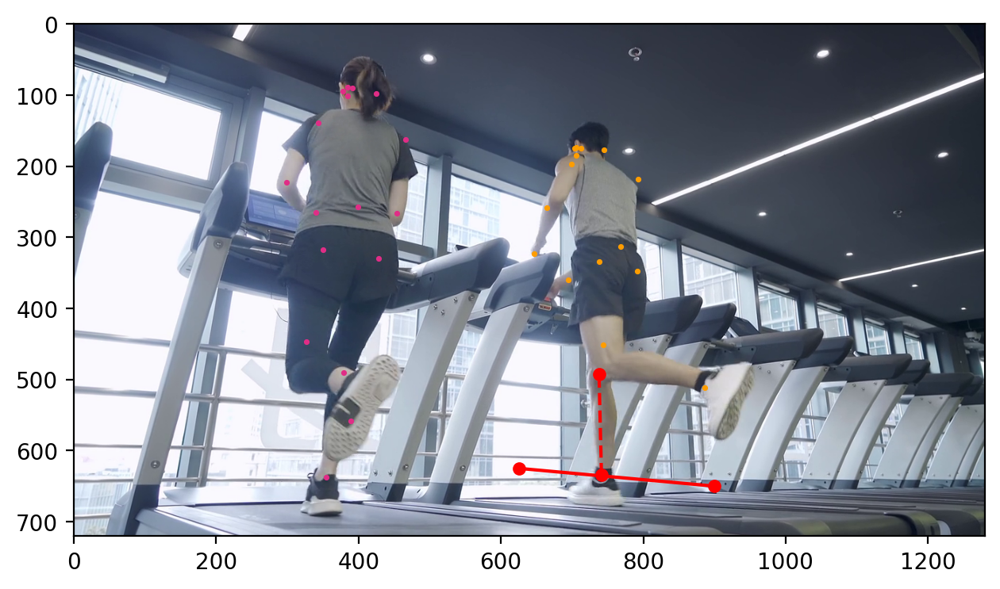

In [270]:
# Looks like RHS runner touches down on
# frame 101
frame = stream_data[101]

# plot keyboints on base image
plot_keypoints(frame)

# plot the "floor"
# get the line coords
x = np.array([900, 625])
y = np.array([650, 625])

m,c, = solve_line(x,y)

# plot floor points & line
plt.plot(x, y, 'o', c='r', label='Original data', markersize=5)
plt.plot(x, m*x + c, 'r', label='Fitted line')

# limb
limbs = Limbs()
r_shin = frame['kpts'][1][limbs.get_limb_by_name('right_shin')]
plt.plot(r_shin[:,0], r_shin[:,1], 'ro--', label='limb', markersize=5, linewidth=1.5);

Turns out there is a an issue with the model... While the YOLO is able to predict keypoints and bounding boxes, there doesn't seem to be anything that guarantees these keypoints will align with the same person across frames.. Below, in frame 106 the keypoints at index 0 align with the RHS runner, but in frame 107 the keypoints align with the LHS runner....

In [423]:
def plot_image_pairs(
    fr1_id, fr2_id, stream_data, runner_id=1, figsize=(14,7), s=4.5, c='r'):
    """ 
    plot two images side by side with keypoints
    for a single runner
    """
    f1, f2 = stream_data[fr1_id], stream_data[fr2_id]
    
    # get keypoint coords
    x1, y1 = f1['kpts'][runner_id][:,0], f1['kpts'][runner_id][:,1]
    x2, y2 = f2['kpts'][runner_id][:,0], f2['kpts'][runner_id][:,1]
    
    # plot
    fig, axs = plt.subplots(1,2, figsize=figsize)
    
    axs[0].imshow(f1['orig_img']) # don't care about colour conversion
    axs[1].imshow(f2['orig_img'])
    
    axs[0].scatter(x1, y1, s=s, c=c)
    axs[1].scatter(x2, y2, s=s, c=c)
    
    axs[0].set_title(f'frame {fr1_id}')
    axs[1].set_title(f'frame {fr2_id}');

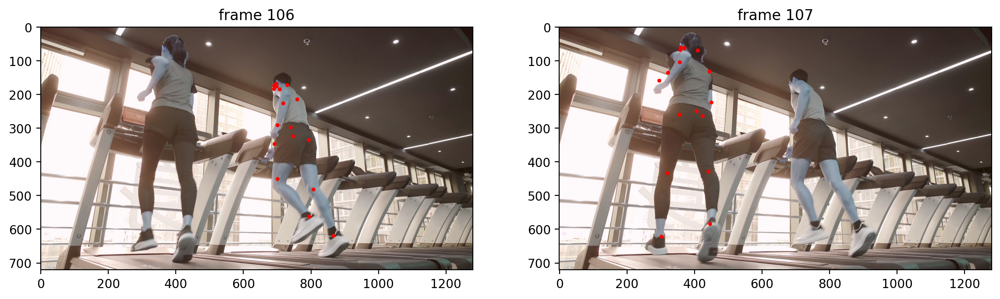

In [246]:
plot_image_pairs(106,107, stream_data, runner_id=0)

# Sidebar: points inside polygon...

One way to solve this problem would be to...
- check each frame, assert whether the keypoints are inside a bounding box that covers the runner of interest
- identify the frames where this is not true
- for these frames, simply switch the arrays containing the keypoints

The nature of the video makes this task somewhat easier than it would be if the camera were not fixed!

In [235]:
# dummy example

poly = plt.Rectangle(
    xy=(570,10), 
    width=1000-570, height=700, 
    fill=False
)

points = np.array([[800,600], [800,400]])

poly.contains_points(points)

array([ True,  True])

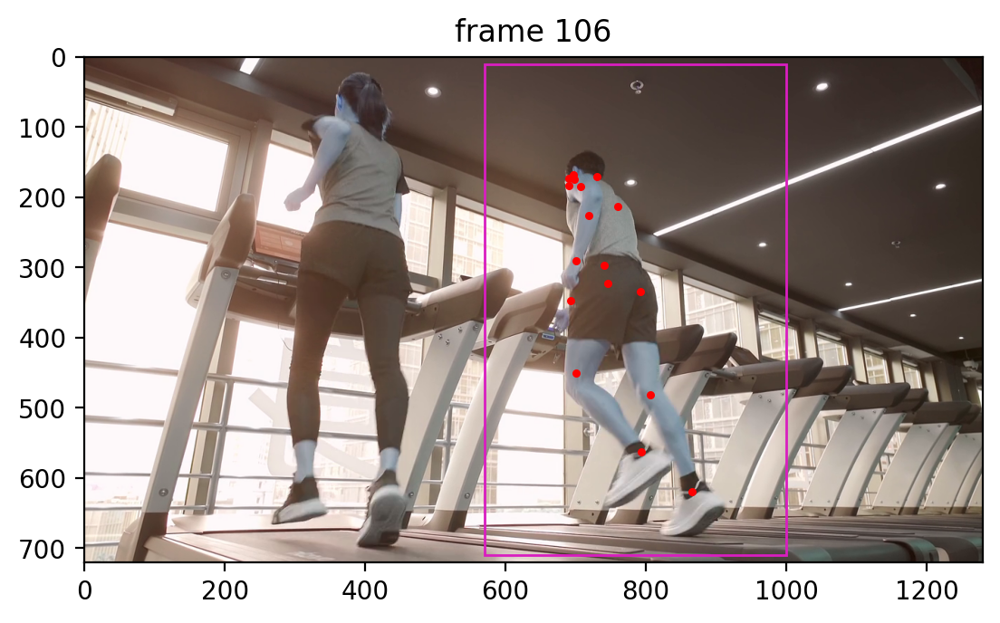

In [109]:
# plot bounding box
fig, ax = plt.subplots()

bbox = plt.Rectangle(
    xy=(570,10), 
    width=1000-570, height=700, 
    fill=False,
    ec="#d91ec0"
)

ax.imshow(f_106['orig_img'], cmap='gray')
ax.scatter(x_106, y_106, s=5, c='r')
ax.add_patch(bbox)
ax.set_title('frame 106');

In [112]:
# check for a single frame
points_106 = f_106['kpts'][0][:,:2].numpy()
points_107 = f_107['kpts'][0][:,:2].numpy()

bbox = plt.Rectangle(
    xy=(570,10), 
    width=1000-570, height=700, 
    fill=False
)
# 106 is inside, 107 is outside.
bbox.contains_points(points_106), bbox.contains_points(points_107)

(array([ True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True]),
 array([False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]))

In [119]:
# box is empty!
np.sum(bbox.contains_points(points_107))

0

In [148]:
# how often is this happening?
res = []

for f in stream_data:
    f_id = f['frame']

    # get points from obj
    points_0 = f['kpts'][0][:,:2].numpy()
    points_1 = f['kpts'][1][:,:2].numpy()

    contains_points_0 = np.where(np.sum(bbox.contains_points(points_0)) > 0, True, False).item()
    contains_points_1 = np.where(np.sum(bbox.contains_points(points_1)) > 0, True, False).item()

    res.append({
        'frame':f_id,
        'contains_points_0':contains_points_0,
        'contains_points_1':contains_points_1
    })
    
df = pd.DataFrame(res)

In [152]:
# only ~30% of the frames in 
# contains_points_0 column belong to runner on RHS
df.contains_points_0.mean(), df.contains_points_1.mean()

(0.32662192393736017, 0.6733780760626398)

In [205]:
df.head()

,frame,contains_points_0,contains_points_1
0,0,False,True
1,1,True,False
2,2,True,False
3,3,False,True
4,4,False,True


## swapping problematic points

In [228]:
# put it all together
# loop through stream data
# if frame id is in the list 
# of problematic frames
# swap data

stream_data_fix = []
frames_to_swap = df[df.contains_points_1 == False].frame.values

for f in stream_data:
    # get id, image & keypoints
    f_id = f['frame']
    orig_img = f['orig_img']
    kpts = f['kpts']

    # get object points (ie person 0 and 1)
    points_0 = kpts[0]
    points_1 = kpts[1]

    if f_id in frames_to_swap:

        # swap points
        new_kpts = torch.tensor(np.array([points_1.numpy(),points_0.numpy()]))
        
        # dims should match
        assert new_kpts.shape == torch.Size([2, 17, 3])
        
        data = {'frame':f_id, 'orig_img':orig_img, 'kpts':new_kpts}
        
    else: 
        data = {'frame':f_id, 'orig_img':orig_img, 'kpts':kpts}
    
    stream_data_fix.append(data)

# sort so frame ids match
stream_data_fix = sorted(stream_data_fix, key=lambda x: x['frame']) 

In [229]:
type(stream_data), len(stream_data), type(stream_data_fix), len(stream_data_fix)

(list, 447, list, 447)

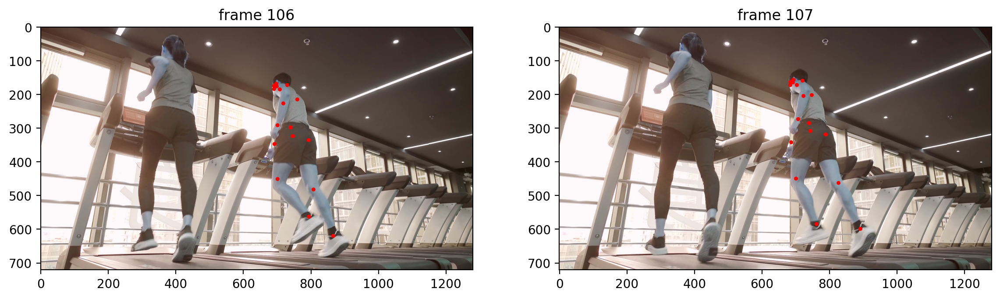

In [242]:
plot_image_pairs(106,107, stream_data_fix, 1)

After the swap, all points belonging to the RHS runner are now indexed with `id=1`

# Back to the main problem

- Extracting leg data. Specifically the foot and shin coordinatses.
- Calculating error between foot and floor
- building a table with the data we care about

In [338]:
def calc_leg_floor_error(shin):
    """
    return the index and error
    of the limb closest to the floor
    """
    out = []
    for i,points in enumerate(shin):
        inter = calc_intersection_point(m,c,points)
        e = RMSE(points, inter)
        #out.append({i:e})
        out.append({'idx':i, 'error':e})
    return min(out, key=lambda x: list(x.values())[0])

In [336]:
shin = stream_data_fix[0]['kpts'][0][limbs.get_limb_by_name('left_shin')][:,:2].numpy()
calc_leg_floor_error(shin)

{'idx': 0, 'error': 237.58837890625261}

In [357]:
RHS_runner_id = 1
limbs = Limbs()

res = []

for f in stream_data_fix:
    
    # data
    f_id = f['frame']
    orig_img = f['orig_img'][[RHS_runner_id]]
    kpts = f['kpts'][RHS_runner_id]
    
    # get leg coordinates
    l_shin = kpts[
        limbs.get_limb_by_name('left_shin')][:,:2].numpy()
    r_shin = kpts[
        limbs.get_limb_by_name('right_shin')][:,:2].numpy()

    # get error for closest val
    l_shin_err = calc_leg_floor_error(l_shin)
    r_shin_err = calc_leg_floor_error(r_shin)
    
    data = {
        'frame':f_id, 
        'orig_img':orig_img, 
        'kpts':kpts,
        'l_shin':l_shin,
        'r_shin':r_shin,
        'l_shin_err_id':l_shin_err['idx'],
        'r_shin_err_id':r_shin_err['idx'],
        'l_shin_err':l_shin_err['error'],
        'r_shin_err':r_shin_err['error'],
    }

    res.append(data)

In [358]:
df_legs = pd.DataFrame(res)

df_legs.head(2)

,frame,orig_img,kpts,l_shin,r_shin,l_shin_err_id,r_shin_err_id,l_shin_err,r_shin_err
0,0,"[[[73, 45, 37], [73, 45, 37], [73, 45, 37], [7...","[[tensor(721.7922), tensor(148.8591), tensor(0...","[[940.49304, 509.91675], [804.28107, 435.70178]]","[[736.6238, 616.66504], [762.37585, 461.6278]]",0,0,1581.408813,203.308350
1,1,"[[[73, 45, 37], [73, 45, 37], [73, 45, 37], [7...","[[tensor(726.7953), tensor(159.0453), tensor(0...","[[933.1233, 482.19775], [783.6169, 438.49356]]","[[743.5001, 630.4986], [760.86804, 479.3217]]",0,0,1878.947998,58.015564


## Error distribution

looking at the below plots, we can see that the lowest error values occur below the 25% quartile. We can use this to filter the data and roughly categorise the initial contact. This is just a starting point. Some manual curation afterwards will be done to clean up the data properly. Given this is only a small dataset (<500 rows) this is feasible, but for large production tables I would refine this method and implement something more robust!

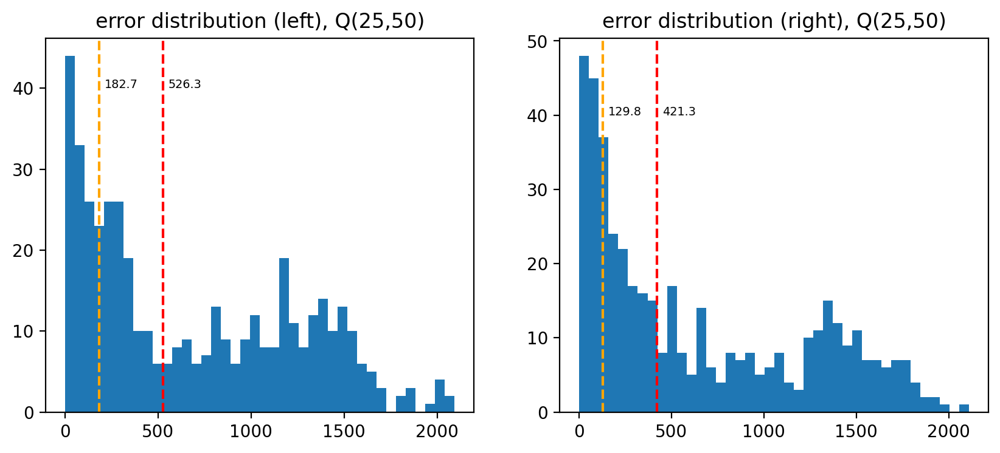

In [1408]:
fig, axs = plt.subplots(1,2, figsize=(10,4))

axs[0].hist(df_legs['l_shin_err'], bins=40)
axs[1].hist(df_legs['r_shin_err'], bins=40)

axs[0].set_title(f"error distribution (left), Q(25,50)")
axs[1].set_title(f"error distribution (right), Q(25,50)")

quantiles = [.25, .50]
colors = ['orange', 'red', 'orange']

for q, c in zip(quantiles, colors):
    lq = df_legs['l_shin_err'].quantile(q)
    rq = df_legs['r_shin_err'].quantile(q)
    
    axs[0].axvline(lq, 0, 1, color=c, ls='--')
    axs[0].text(lq+30,40, f'{lq:.1f}', fontsize='x-small')
    axs[1].axvline(rq, 0, 1, color=c, ls='--')
    axs[1].text(rq+30, 40, f'{rq:.1f}', fontsize='x-small');

Manually counting the initial contact points for the RHS runner gives 23 for the right leg and 22 for the left. This is is a good enough guide for how many points to expect in this small dtaset. I have taken a wider percentile (10th) that includes more than 23 points, because it is likely that two points close together will have very similar errors.

In [445]:
lq = df_legs['l_shin_err'].quantile(.10)
rq = df_legs['r_shin_err'].quantile(.10)

df_legs['l_initial_contact'] = np.where(df_legs['l_shin_err'] < lq, True, False)
df_legs['r_initial_contact'] = np.where(df_legs['r_shin_err'] < rq, True, False)

# right leg initial contact 23 times
# left leg initial contact 22 times
df_legs['l_initial_contact'].value_counts(), df_legs['r_initial_contact'].value_counts()

(l_initial_contact
 False    402
 True      45
 Name: count, dtype: int64,
 r_initial_contact
 False    402
 True      45
 Name: count, dtype: int64)

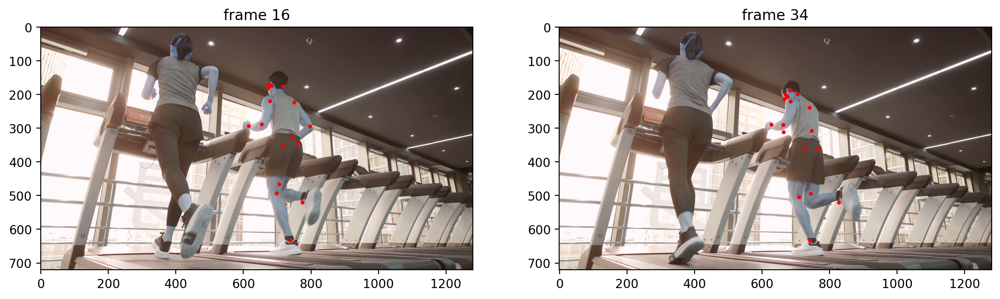

In [421]:
# check a few frames 
plot_image_pairs(16, 34, stream_data_fix, 1)

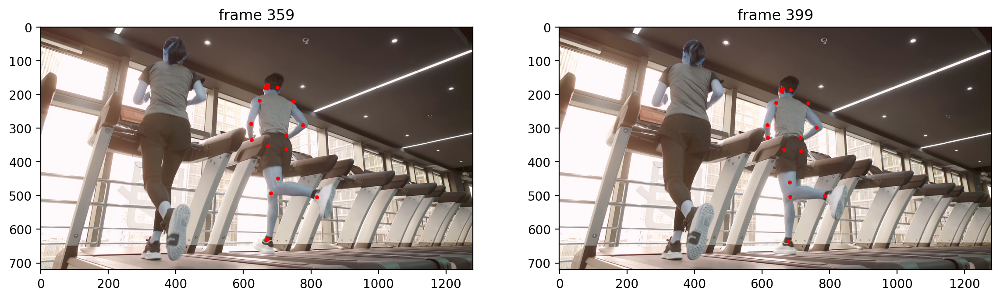

In [422]:
plot_image_pairs(359, 399, stream_data_fix, 1)

Not bad at all! As expected, if you look at the data you will see that there examples where two sequential frames have been flagged as initial contact - this is because these frames are close enough that both have low error.

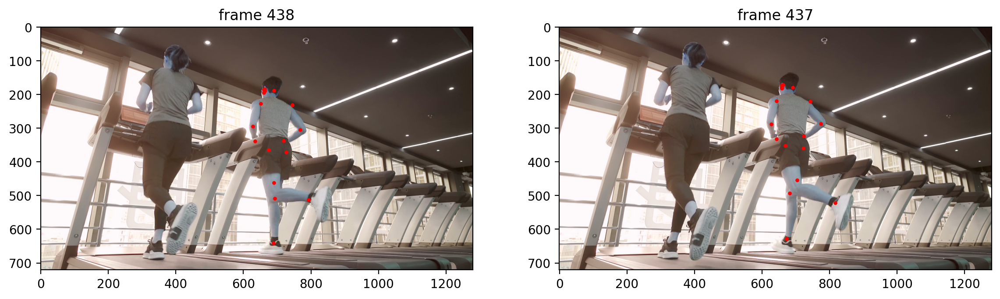

In [502]:
plot_image_pairs(438, 437, stream_data_fix, 1)

The data was exported and some manual cleaning was done. Specifically, ensuring only a single point of contact was flagged for each leg as it hits the treadmill.

In [1409]:
df_leg_adj = pd.read_csv('df_leg_adjusted.csv')
df_leg_adj = df_legs[['frame','orig_img','kpts','l_shin','r_shin','l_shin_err_id','r_shin_err_id']].merge(df_leg_adj, how='left', on='frame')
df_leg_adj.head(2)

,frame,orig_img,kpts,l_shin,r_shin,l_shin_err_id,r_shin_err_id,l_initial_contact,r_initial_contact,l_shin_err,r_shin_err
0,0,"[[[73, 45, 37], [73, 45, 37], [73, 45, 37], [7...","[[tensor(721.7922), tensor(148.8591), tensor(0...","[[940.49304, 509.91675], [804.28107, 435.70178]]","[[736.6238, 616.66504], [762.37585, 461.6278]]",0,0,False,False,1581,203
1,1,"[[[73, 45, 37], [73, 45, 37], [73, 45, 37], [7...","[[tensor(726.7953), tensor(159.0453), tensor(0...","[[933.1233, 482.19775], [783.6169, 438.49356]]","[[743.5001, 630.4986], [760.86804, 479.3217]]",0,0,False,False,1879,58


# Building a classifer

In [582]:
def get_shin_coords(x, col=0):
    return x[0][col]

In [1236]:
X_df = df_leg_adj

shins = ['l_shin', 'r_shin']

X_data = []

for s in shins:
    x_coord = X_df[s].apply(get_shin_coords, col=0)#.values
    y_coord = X_df[s].apply(get_shin_coords, col=1)#.values
    X_data.append(x_coord)
    X_data.append(y_coord)

In [1279]:
# X , y
X = np.array(X_data).T
#y_l = np.where(df_leg_adj['l_initial_contact'] == True, 1,0)
#y_r = np.where(df_leg_adj['r_initial_contact'] == True, 1,0)

# let's predict both left and right leg
# to improve data sparsity and because
# we know which leg is which based on skeleton
y = np.sum(df_leg_adj[['l_initial_contact','r_initial_contact']], axis=1).values

## RandomForestClassifier w GridSearchCV

GridSearch is a process of performing hyperparameter tuning in order to find optimal values for a machine learing model. Generally speaking, there is no way to know in advance the best parameters for a model in a given problem setting. GridSearch helps by providing an automated way to search through a defined parameter space, and returns the optimal values. 

The problem I am facing with this data is that the event I are interested in, happens very infrequently. The majority class in this data would be every frame where the RHS runner's foot is not making contact with the treadmill. Basically, the class labels in this dataset are very imbalanced. 

There are many strategies to help deal with this. The method that improved model fit in this example was a balanced class weighting strategy. Here, the values of y are used to automatically adjust weights inversely proportional to the class frequencies. The `balanced_subsample` argument means this is performed for each bootstrap sample for every tree grown.

In [1215]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

In [1280]:
# training spit
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=123)

In [1232]:
param_grid = [
    {
        'n_estimators': [5, 10, 20], 
        'max_depth':[2,3,6], 
        'class_weight':['balanced', 'balanced_subsample']
    }]

grid = GridSearchCV(
    estimator=RandomForestClassifier(),
    param_grid=param_grid,
    refit=True,
    n_jobs=-1,
    verbose=1,
)

grid.fit(X_train, y_train)

# print best parameter after tuning 
print(grid.best_params_,'\n') 

# TEST
test_accuracy = grid.score(X_test, y_test)
print('Accuracy of the best parameters using the inner CV of')
print(f'the random search: {grid.best_score_:.3f}')
print(f'Accuracy on test set: {test_accuracy:.3f}')

Fitting 5 folds for each of 18 candidates, totalling 90 fits
{'class_weight': 'balanced', 'max_depth': 6, 'n_estimators': 5} 

Accuracy of the best parameters using the inner CV of
the random search: 0.916
Accuracy on test set: 0.900


fit the model using the best params

In [1233]:
#take best params
clf = RandomForestClassifier(
    **grid.best_params_,
    random_state=123
)

clf.fit(X_train, y_train)

clf.score(X_train, y_train), clf.score(X_test, y_test)

(0.9607843137254902, 0.9)

In [1234]:
clf.predict(X_test)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0])

In [1235]:
y_test

array([0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0])

## MLP

out of interest, see how an MLP does. The random forrest did a pretty good job. It certainly provides a much more efficient method for identifyign the inital contact points than the functional methods I built above to help create the data set in the first place. 

In [633]:
import torch
import torch.nn as nn

In [1281]:
# convert to tensors
X_train = torch.from_numpy(X_train)
X_test = torch.from_numpy(X_test)
y_train = torch.from_numpy(y_train)
y_test = torch.from_numpy(y_test)

In [1338]:
def train_mlp_classifier(model, optim, criterion, X_train, y_train, X_test, y_test, num_epochs=100):
    for epoch in range(num_epochs):
        
        # zero grad
        model.train()
        optim.zero_grad()

        # forward, loss
        # -------------
        # preds -> (n examples, n classes) (357, 2)
        preds = model(X_train)
        loss = criterion(preds, y_train)

        # backprop, step
        loss.backward()
        optim.step()

        # validate
        acc = eval_mlp_classifier(model, X_test, y_test)
        
        log = f'Epoch: {epoch:03d}, Train Loss: {loss:.3f}, Val Acc: {acc:.3f}'
        
        if epoch % 100 == 0:
            print(log)

def eval_mlp_classifier(model, X_test, y_test):
    model.eval()
    out = model(X_test).argmax(dim=1) # get preds
    correct = (out == y_test).sum()
    acc = int(correct) / len(y_test)
    return acc

In [1346]:
class MLP(nn.Module):
    """ 
    MLP classifier 
    --------------

    n_input: number input features
    n_output: number of classes
    n_hidden: number of hidden layers
    """
    def __init__(self, n_input=4, n_output=2, n_hidden=64):
        super().__init__()

        self.model = nn.Sequential(
            
            nn.Linear(n_input, n_hidden*8),
            nn.ReLU(),
            nn.Dropout(0.2),
            
            nn.Linear(n_hidden*8, n_hidden*4),
            nn.ReLU(),
            #nn.Dropout(0.2),
            
            nn.Linear(n_hidden*4, n_output),
        )

    def forward(self, x):
        return self.model(x)

In [1347]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# init
mlp = MLP().to(DEVICE)

# optimiser and loss
optim = torch.optim.Adam(mlp.parameters(), lr=0.001, weight_decay=.05)

criterion = nn.CrossEntropyLoss(weight=torch.tensor([.2, 1.]))

In [1348]:
train_mlp_classifier(mlp, optim, criterion, X_train, y_train, X_test, y_test, num_epochs=300)

Epoch: 000, Train Loss: 21.817, Val Acc: 0.133
Epoch: 100, Train Loss: 1.545, Val Acc: 0.878
Epoch: 200, Train Loss: 0.540, Val Acc: 0.889


In [1349]:
mlp(X_test).argmax(1)

tensor([0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0])

In [1345]:
y_test

tensor([0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0])

Not bad, maybe more consistent that the random forrest but still misses a few points of contact.

# Summary 

What a journey! This notebook was an exploration into using pose data from YOLOv8. Off the shelf, YOLO is a very impressive model but all you ever see online are videos of object detection on street scenes, people dancing, excersising or holding cups and pens up to their webcams. I wanted to understand how useable the data from YOLO actaully is and how it could use to estimate something specific. 

Classifying a runners gait is nothing new, but the idea here was to illustrate how much thought, preparation and work there is in exploring, cleaning and preparing the pose data for a downstream task.

## Where to next?

There are a few things that I would have liked to try but this notebook got a bit big to fit it all in!

I would have liked to see how the model performs on the second runner in the frame, this would help in understanding whether the model is able to generalise. I suspect that the model wouldn't perform well on the LHS runner because the magnitude of the X coordinates would be smaller that for the RHS runner due to their position on screen. 

A potential workaround would be to perform some simple data augmentation on the RHS coordinates, this would hopefully help the model to learn to be invariant to the scale. Another idea could be to include all keypoints for the RHS runner during training or even represent the data as a graph and apply graph representation learning techniques to the data, specifically, this could mean that we can encode in the feet or leg data information propagated from the other keypoints in the body. Maybe this would encode more useful information and assist better in the task. 

I'd also like to try these models on some more dynamic video content, like someone running outside or around a track or being followed with a handheld camera. 

#### references
- [physio-pedia running biomechanics](https://www.physio-pedia.com/Running_Biomechanics)
- [pexels woman and man on treadmill](https://www.pexels.com/video/woman-and-man-jogging-on-treadmill-in-gym-12998221/)